# Karaoke Recommender

### DATA DICTIONARY

id (string)
>The Spotify ID for the track.

acousticness (float)
>A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.

analysis_url (string)	
>An HTTP URL to access the full audio analysis of this track. An access token is required to access this data.

danceability (float)	
>Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

duration_ms (int)	
>The duration of the track in milliseconds.

energy (float)	
>Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.
Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.

instrumentalness (float)
>Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

key (int)	
>The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.

liveness (float)
>Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

loudness (float)
>The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.

mode (int)	
>Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

speechiness (float)	
>Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.

tempo (float)	
>The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.
time_signature	int	An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).

track_href (string)	
>A link to the Web API endpoint providing full details of the track.

type (string)	
>The object type: "audio_features"

valence	(float)	
>A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

In [1]:
import pandas as pd
import numpy as np

In [2]:
af = pd.read_pickle('karaoke_songs_all.pkl')

In [3]:
af.reset_index(drop=True, inplace=True)

In [7]:
af[af.duplicated('Title')].sort_values(by='Title').head()

,Artist,Title,id,popularity,acousticness,analysis_url,danceability,duration_ms,energy,instrumentalness,...,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
11357,Ella Fitzgerald,'Round Midnight,7dbhdnwrUE3DyRkM1ZqmWl,26,0.9530,https://api.spotify.com/v1/audio-analysis/7dbh...,0.323,207400,0.0396,0.000000,...,0.0991,-17.387,0,0.0353,94.390,4.0,https://api.spotify.com/v1/tracks/7dbhdnwrUE3D...,audio_features,spotify:track:7dbhdnwrUE3DyRkM1ZqmWl,0.138
8756,The Rolling Stones,(I Can't Get No) Satisfaction,2PzU4IB8Dr6mxV3lHuaG34,65,0.0348,https://api.spotify.com/v1/audio-analysis/2PzU...,0.725,222813,0.8530,0.127000,...,0.1960,-7.842,1,0.0353,136.282,4.0,https://api.spotify.com/v1/tracks/2PzU4IB8Dr6m...,audio_features,spotify:track:2PzU4IB8Dr6mxV3lHuaG34,0.897
10732,Michelle Simonal,(I Can't Get No) Satisfaction,5KGkkqaXYVcvKY3XaRdBaK,40,0.4710,https://api.spotify.com/v1/audio-analysis/5KGk...,0.847,212027,0.4460,0.041500,...,0.2690,-11.573,1,0.0584,119.990,4.0,https://api.spotify.com/v1/tracks/5KGkkqaXYVcv...,audio_features,spotify:track:5KGkkqaXYVcvKY3XaRdBaK,0.581
1754,Michael Bolton,(Sittin' On) The Dock Of The Bay,5MUmSoCi7ia09vhztFqk30,30,0.1930,https://api.spotify.com/v1/audio-analysis/5MUm...,0.463,232467,0.7360,0.000006,...,0.1650,-6.891,1,0.0669,178.226,4.0,https://api.spotify.com/v1/tracks/5MUmSoCi7ia0...,audio_features,spotify:track:5MUmSoCi7ia09vhztFqk30,0.508
8555,Otis Redding,(Sittin' On) The Dock Of The Bay,4Y4Gd3ty8uut6Qw43c7yJc,66,0.7880,https://api.spotify.com/v1/audio-analysis/4Y4G...,0.741,162213,0.2800,0.000010,...,0.0668,-12.982,0,0.0340,103.581,4.0,https://api.spotify.com/v1/tracks/4Y4Gd3ty8uut...,audio_features,spotify:track:4Y4Gd3ty8uut6Qw43c7yJc,0.513


In [8]:
# strip spaces
af['Title'] = af['Title'].str.strip()
af['Artist'] = af['Artist'].str.strip()

In [14]:
# pickle dataframe
import pickle

with open('karaoke_songs_final.pkl', 'w') as ks:
    pickle.dump(af, ks)

In [16]:
# open pickled dataframe
with open('karaoke_songs_final.pkl', 'r') as ks:
    af = pickle.load(ks)

In [17]:
# check unique values for column 'type'
af['type'].unique()

array([u'audio_features'], dtype=object)

In [18]:
# check unique values for column 'mode'
af['mode'].unique()

array([1, 0])

In [19]:
# drop columns ('analysis_url','track_href','type','uri')
af.drop(['analysis_url','track_href','type','uri'],axis=1,inplace=True)

In [20]:
af['popularity']=af['popularity'].astype('int')

In [21]:
# check types for columns
af.dtypes

Artist               object
Title                object
id                   object
popularity            int64
acousticness        float64
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature      float64
valence             float64
dtype: object

In [22]:
# Check for nulls
af[pd.isnull(af).any(axis=1)]

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
11466,Boyce Avenue,A Thousand Years,4IQgYbZghcFHBBye6aff45,54,0.768,0.434,263710,0.221,0.0,5,0.106,-11.672,1,0.0329,126.392,NaN,0.219


In [23]:
af.loc[(af.Artist == 'Boyce Avenue') & (af.Title == 'A Thousand Years'),'time_signature'] = 4.0

In [24]:
# Describe audio features 
af.describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
count,12004.000000,12004.000000,12004.000000,1.200400e+04,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000,12004.000000
mean,37.572726,0.301707,0.569867,2.251056e+05,0.614514,0.042026,5.237837,0.191431,-8.137436,0.742752,0.057693,121.900611,3.922609,0.541899
std,19.351296,0.305210,0.149405,6.074430e+04,0.229767,0.159680,3.530092,0.162741,3.782094,0.437135,0.056280,28.979082,0.341413,0.247344
min,0.000000,0.000002,0.080100,2.480000e+04,0.000020,0.000000,0.000000,0.012800,-33.911000,0.000000,0.022200,35.219000,1.000000,0.021500
25%,25.000000,0.031300,0.474000,1.898400e+05,0.444000,0.000000,2.000000,0.094500,-10.388000,0.000000,0.031500,100.016750,4.000000,0.340000
50%,39.000000,0.181000,0.580000,2.196655e+05,0.644000,0.000005,5.000000,0.128000,-7.367000,1.000000,0.039100,120.652500,4.000000,0.545000
75%,51.000000,0.539250,0.675000,2.517398e+05,0.808000,0.000545,8.000000,0.241000,-5.281750,1.000000,0.057600,138.278750,4.000000,0.747000
max,100.000000,0.996000,0.978000,1.694907e+06,0.997000,0.979000,11.000000,0.998000,-0.165000,1.000000,0.919000,217.966000,5.000000,1.000000


In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

In [26]:
afp = af[['Title','Artist','popularity']].sort_values('popularity', ascending = False).head(10)
afp

,Title,Artist,popularity
8427,Closer,The Chainsmokers,100
8478,Heathens,Twenty One Pilots,93
8674,Don't Let Me Down,The Chainsmokers,93
8628,Ride,Twenty One Pilots,91
8470,Say You Won't Let Go,James Arthur,91
8687,The Greatest,Sia,90
10050,Alarm,Anne-Marie,90
1723,Love Me,Justin Bieber,90
8721,"I Hate U, I Love U",Gnash,90
8663,This Is What You Came For,Calvin Harris,90


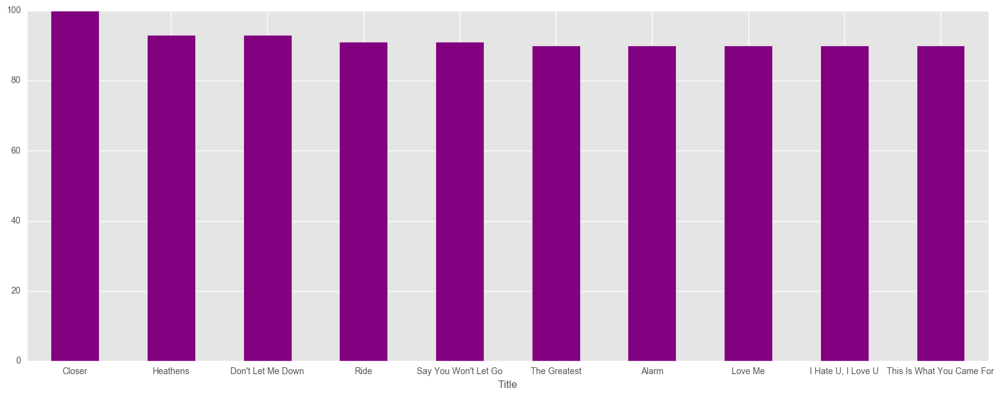

In [27]:
fig, ax = plt.subplots()
afp.plot(kind='bar', x='Title',y='popularity', color='purple', ax=ax,figsize=(16,8))
plt.tight_layout()
ax.set_xticklabels(ax.xaxis.get_majorticklabels(),rotation=360);
ax.legend_.remove()

In [28]:
# Correlation between various features
af_corr = af.corr()
af_corr

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
popularity,1.000000,-0.073731,0.023866,0.094273,0.108341,-0.261127,-0.007340,-0.041328,0.187771,-0.038799,0.069205,-0.002295,0.027844,-0.010092
acousticness,-0.073731,1.000000,-0.254800,-0.156687,-0.722518,-0.014338,-0.021482,-0.031913,-0.531786,0.118981,-0.089994,-0.156294,-0.198070,-0.262587
danceability,0.023866,-0.254800,1.000000,-0.054473,0.206454,0.009389,0.009485,-0.103937,0.120671,-0.120620,0.125657,-0.142487,0.189709,0.522973
duration_ms,0.094273,-0.156687,-0.054473,1.000000,0.039790,0.024241,0.002155,0.014990,0.017402,-0.075624,0.013086,-0.025724,0.016827,-0.225150
energy,0.108341,-0.722518,0.206454,0.039790,1.000000,-0.072785,0.026270,0.146315,0.757118,-0.106875,0.167448,0.205431,0.217481,0.415819
instrumentalness,-0.261127,-0.014338,0.009389,0.024241,-0.072785,1.000000,-0.000575,-0.027916,-0.216435,-0.005703,-0.036032,-0.003015,-0.010681,-0.034170
key,-0.007340,-0.021482,0.009485,0.002155,0.026270,-0.000575,1.000000,-0.017941,0.012729,-0.112814,0.026233,-0.002427,-0.000971,0.019428
liveness,-0.041328,-0.031913,-0.103937,0.014990,0.146315,-0.027916,-0.017941,1.000000,0.074412,0.009576,0.137198,0.013182,0.008746,0.035450
loudness,0.187771,-0.531786,0.120671,0.017402,0.757118,-0.216435,0.012729,0.074412,1.000000,-0.066221,0.088403,0.150234,0.147833,0.163995
mode,-0.038799,0.118981,-0.120620,-0.075624,-0.106875,-0.005703,-0.112814,0.009576,-0.066221,1.000000,-0.103164,0.018262,-0.029577,-0.036225


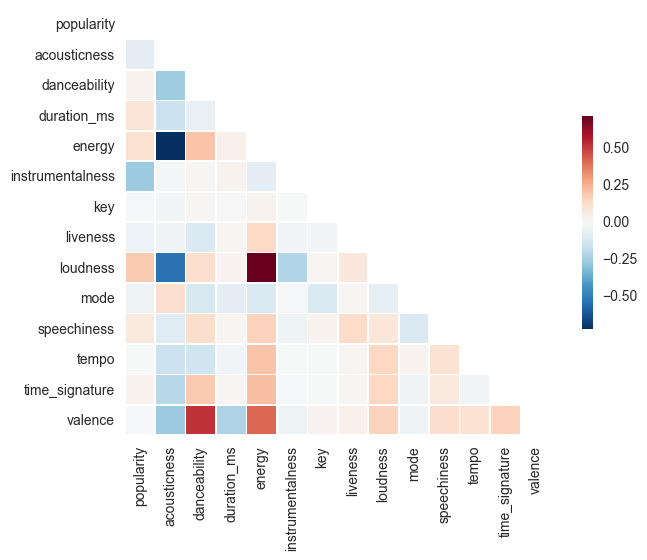

In [29]:
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(af_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(af_corr, mask=mask, vmax=.3,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

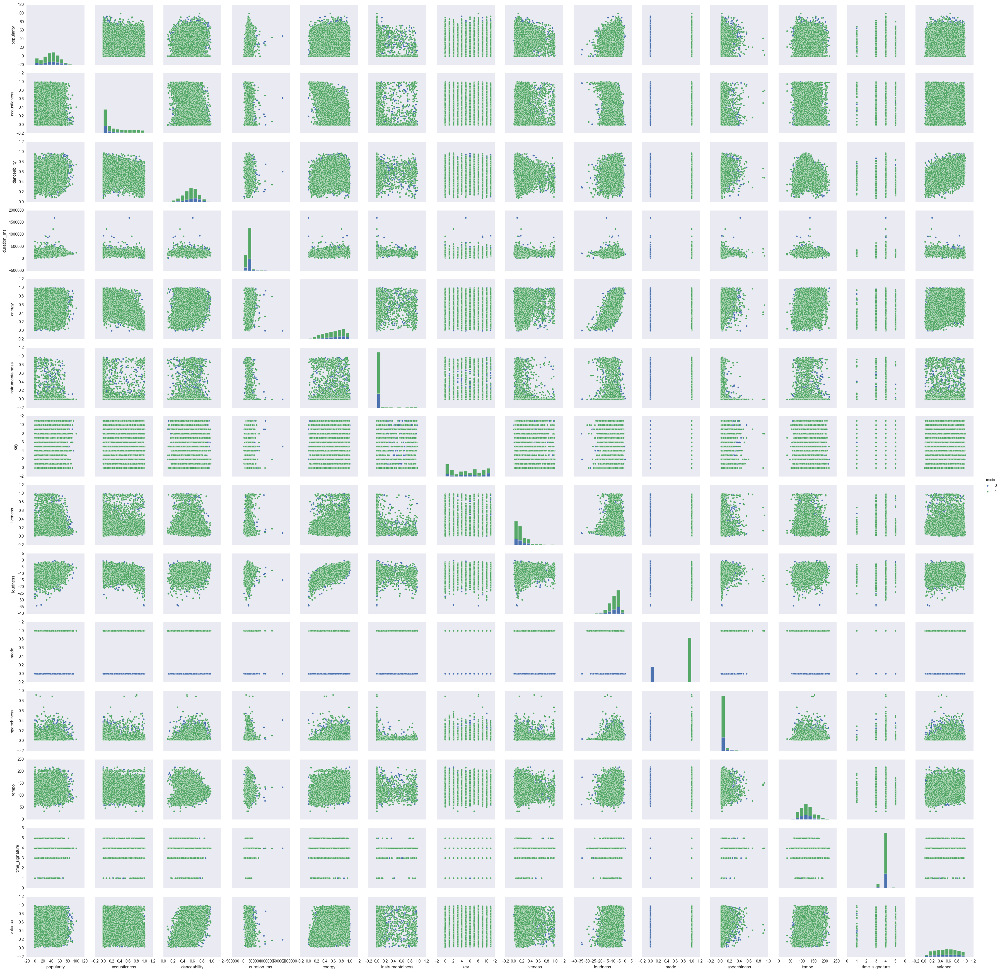

In [30]:
sns.set(style="dark")
sns.pairplot(af, hue='mode');

In [33]:
afe = af[['Title','Artist','energy']].sort_values('energy', ascending = False).head(10)
afe

,Title,Artist,energy
5083,Money,Peace,0.997
3151,High Class Lady,The Lennerockers,0.997
1204,Mr. Vain,Culture Beat,0.997
4618,Just Because,Jane's Addiction,0.996
809,"Marie, Marie",Shakin' Stevens,0.995
6288,Love Truth and Honesty,Bananarama,0.994
11923,Blue Suede Shoes (Live),Elvis Presley,0.994
8109,Angel In The Night,Basshunter,0.993
2484,Smack My Bitch Up,The Prodigy,0.993
6645,Just Like A Pill,Cascada,0.992


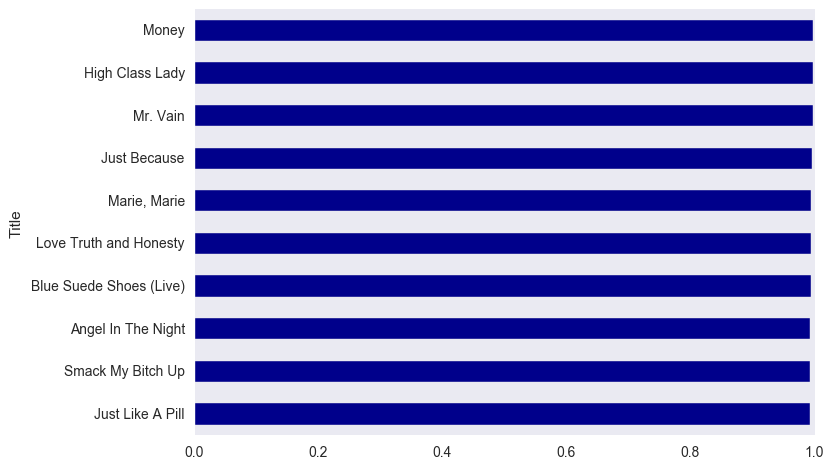

In [34]:
fig, ax = plt.subplots()
afe.plot(kind='barh', x='Title',y='energy', color='darkblue', ax=ax)
plt.gca().invert_yaxis()
ax.legend_.remove()

In [35]:
afd = af[['Title','Artist','danceability']].sort_values('danceability', ascending = False).head(10)
afd

,Title,Artist,danceability
8384,Ice Ice Baby,Vanilla Ice,0.978
4804,ATM Jam,Azealia Banks,0.975
7063,Trick Me,Kelis,0.970
3616,It's the Same Old Shillelagh,Irish Band,0.965
10901,Anaconda,Nicki Minaj,0.965
10436,Hot In Herre,Nelly,0.965
10070,Humpty Dumpty,Nursery Rhyme,0.965
2940,Big And Chunky,will.i.am,0.963
11091,Christmas Tree,Lady Gaga,0.960
2458,Girlfriend,Pebbles,0.956


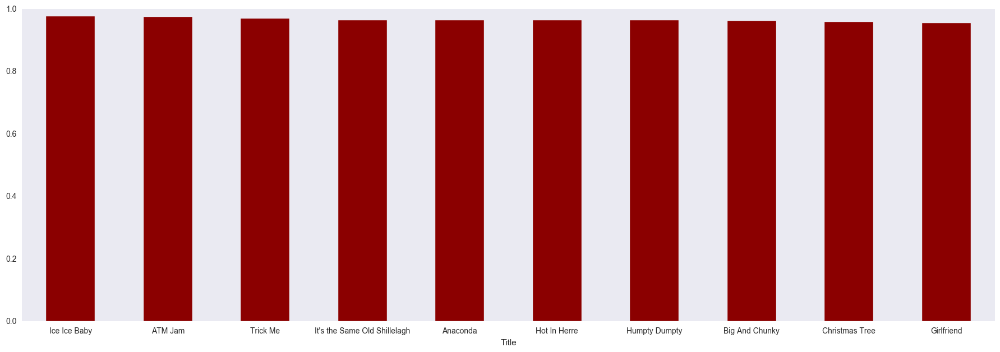

In [36]:
fig, ax = plt.subplots()
afd.plot(kind='bar', x='Title',y='danceability', color='darkred', ax=ax, legend=False, figsize=(18,8))
plt.tight_layout()
ax.set_xticklabels(ax.xaxis.get_majorticklabels(),rotation=360);

In [37]:
aft = af[['Title','Artist','tempo']].sort_values('tempo', ascending = False).head(10)
aft

,Title,Artist,tempo
6232,Love How It Hurts,Scouting for Girls,217.966
7229,Spin The Black Circle,Pearl Jam,217.913
8831,Alphabet Song,Nursery Rhyme,216.126
11644,Jesus Just Left Chicago,ZZ Top,215.918
7382,Losing,Becky Hill,213.910
8395,You're The One That I Want,Grease,213.840
9919,"Lovin', Touchin', Squeezin'",Journey,211.261
2805,Leave It All To Me,Miranda Cosgrove,209.767
9791,It's Too Late,Carole King,208.282
4948,Clean,Taylor Swift,208.171


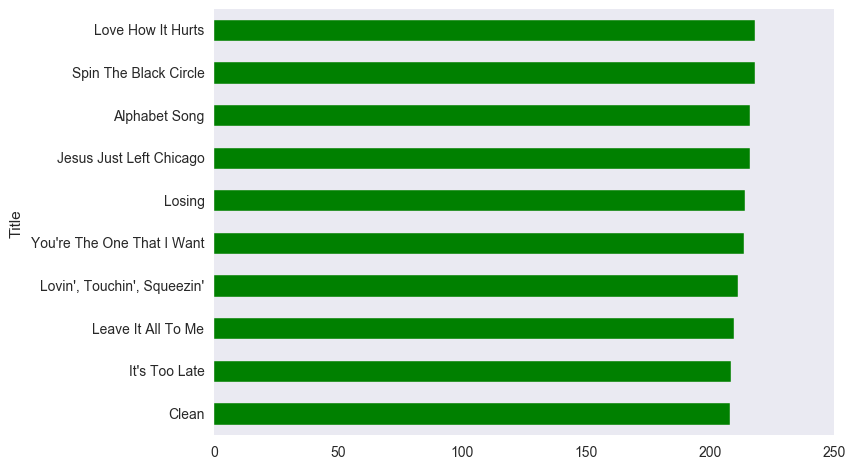

In [38]:
fig, ax = plt.subplots()
aft.plot(kind='barh', x='Title',y='tempo', color='green', ax=ax)
plt.gca().invert_yaxis()
ax.legend_.remove()

# DATA MINING

In [39]:
import math
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.preprocessing import LabelEncoder

In [40]:
af.T

,0,1,2,3,4,5,6,7,8,9,...,11994,11995,11996,11997,11998,11999,12000,12001,12002,12003
Artist,Elvis Presley,Dr. Hook & The Medicine Show,Eddie Cochran,Beyoncé,My Chemical Romance,Jack Johnson,Randy Travis,Eva Cassidy,Goo Goo Dolls,Lorrie Morgan,...,Glee,Salsoul Orchestra,Bobby Helms,John Cafferty & The Beaver Brown Band,Michael Bublé,The Four Tops,Diana Ross,Amy Winehouse,Chris Young,Lonestar
Title,You Don't Know Me,Walk Right In,C'mon Everybody,Ego,I'm Not Okay (I Promise),Someday At Christmas,An Old Pair Of Shoes,Need Your Love So Bad,Name,Five Minutes,...,Get It Right,Little Drummer Boy,My Special Angel,On The Dark Side,Call Me Irresponsible,Reach Out (I'll Be There),When You Tell Me That You Love Me,The Girl From Ipanema,The Man I Want To Be,I'm Already There
id,4BWVBdeEiPcXP5KVcWCeO3,6v9UOHsr45DOHTV5ktvNRc,7Lfp7FsKI4buEJYbMlt7QU,6GcuA4J9ruyClBizBd4m5E,7lRlq939cDG4SzWOF4VAnd,6ShAxK5egTFaalJMty15Si,5gwAf1bzkN7k22GQMopCQ9,2BlAyv83CxlxxdiFFXBH42,1G8jae4jD8mwkXdodqHsBM,0b0jfxRfqfbOVOORCqfIhi,...,2IIdrejPZuHHFpc3LbTtEK,5YriovJ2avH92qrIxdzBvb,700OFVcv0ARG2QrFPDjHNO,7DhNAYOzIRkEFqimYl2s1G,4T6HLdP6OcAtqC6tGnQelG,2Y8wN1dpvzHdjV5cwza5wV,2bWTFMYMcJQptHUZuDvC8P,7F5rIyOI88zk36AiBXC8xq,5zMRkxgFscsPItPsMy4ItS,34Vn9nKfztyLco9lJazy4j
popularity,26,19,44,58,67,50,0,9,59,29,...,49,24,9,40,72,34,45,50,54,55
acousticness,0.924,0.0388,0.134,0.155,0.00602,0.612,0.141,0.208,0.0691,0.454,...,0.331,0.00164,0.776,0.0357,0.39,0.128,0.293,0.312,0.635,0.61
danceability,0.407,0.808,0.633,0.623,0.21,0.801,0.762,0.595,0.464,0.754,...,0.419,0.677,0.559,0.392,0.686,0.619,0.532,0.688,0.489,0.377
duration_ms,147360,185760,116560,236360,186480,130760,171632,278827,270000,212320,...,227853,359000,173093,161827,212373,181280,236240,166960,207213,253373
energy,0.22,0.948,0.699,0.389,0.94,0.192,0.345,0.375,0.701,0.402,...,0.549,0.505,0.376,0.727,0.688,0.846,0.553,0.616,0.498,0.395
instrumentalness,0.0298,0.0024,0.000146,0,0,0,0.00137,3.79e-06,0.00182,7.89e-05,...,0,0.539,2.4e-05,0.000239,1.03e-06,0,0,4.96e-06,1.91e-06,0
key,11,2,3,1,9,0,3,9,9,7,...,2,9,0,9,6,3,4,9,7,3


In [41]:
x = af.iloc[:,4:]
X = StandardScaler().fit_transform(x)

In [42]:
af_norm = pd.DataFrame(X, columns=[x.columns])

/Users/andrewjeong/anaconda/lib/python2.7/site-packages/seaborn/categorical.py:2171: UserWarning: The boxplot API has been changed. Attempting to adjust your arguments for the new API (which might not work). Please update your code. See the version 0.6 release notes for more info.
  warnings.warn(msg, UserWarning)


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 <a list of 13 Text xticklabel objects>)

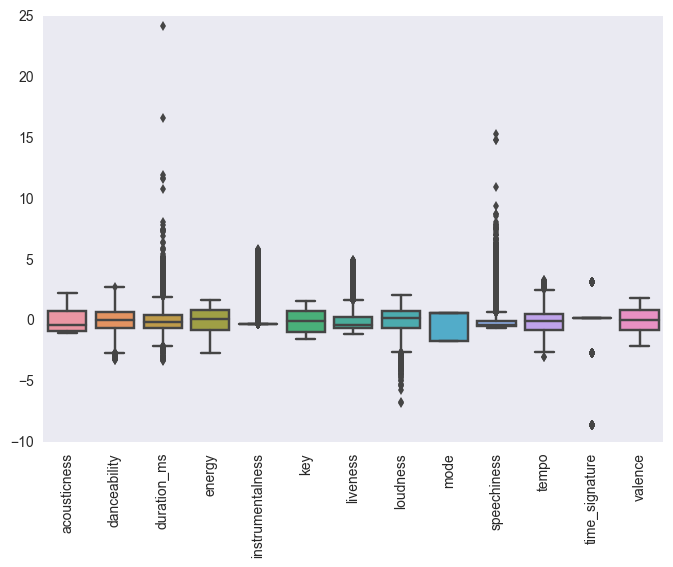

In [43]:
sns.boxplot(af_norm)
plt.xticks(rotation=90) 

# MODELING

In [44]:
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import cross_validation

/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


### Vanilla Linear Regression

In [45]:
np.min(af['popularity'])

0

In [46]:
np.max(af['popularity'])

100

In [47]:
X = X
y = af['popularity']

In [48]:

lm = linear_model.LinearRegression()
lm.fit(X,y)

pred = lm.predict(X)
print ("r2 = ",r2_score(y, pred))
print ("MSE =", mean_squared_error(y, pred))
print ("RMSE =", round(np.sqrt(mean_squared_error(y, pred)), 2))

print ()
print ("Coefficients:")

for i,j in zip(x.columns, lm.coef_):
    print (i, ':', j)

('r2 = ', 0.10437407982265956)
('MSE =', 335.35949392059291)
('RMSE =', 18.31)
()
Coefficients:
(u'acousticness', ':', 0.16483417208591372)
(u'danceability', ':', 0.18790488407129602)
(u'duration_ms', ':', 1.7913552751377262)
(u'energy', ':', -0.28799803396316381)
(u'instrumentalness', ':', -4.4762882404838145)
(u'key', ':', -0.26477784088120099)
(u'liveness', ':', -1.2484273465125577)
(u'loudness', ':', 3.0108805336049627)
(u'mode', ':', -0.37454716859344206)
(u'speechiness', ':', 1.1612231241959616)
(u'tempo', ':', -0.40161907704370692)
(u'time_signature', ':', 0.056302144417311739)
(u'valence', ':', -0.44856672502038097)


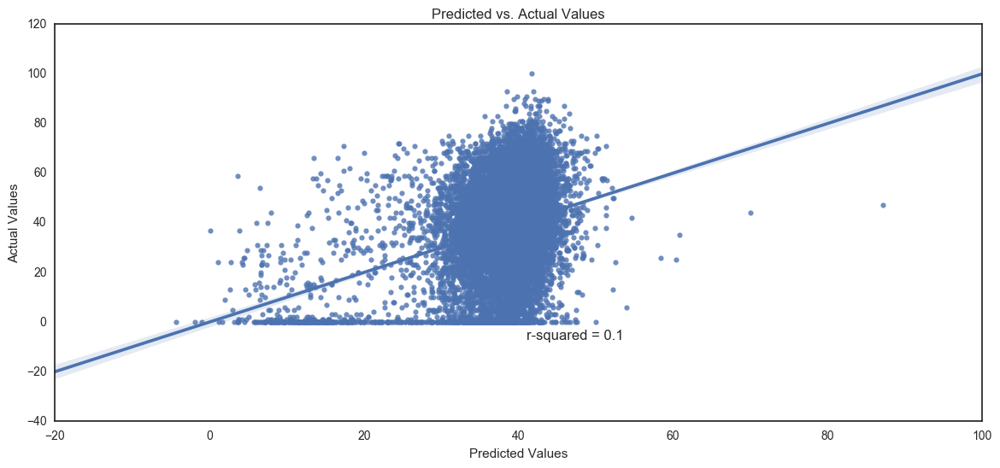

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-white')
%matplotlib inline

ax = sns.regplot(pred, y)
ax.figure.set_figheight(6)
ax.figure.set_figwidth(14)
plt.annotate('r-squared = ' + str(round(r2_score(y, pred),2)), xy=(41,-7), fontsize=12)
ax.set_ylabel('Actual Values')
ax.set_xlabel('Predicted Values')
ax.set_title('Predicted vs. Actual Values');

### Cross Validation - Lasso/ Ridge

In [50]:
from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import cross_val_predict
from sklearn.model_selection import cross_val_score


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33)

#### Lasso

In [51]:
lasso = linear_model.Lasso(alpha=.01)
model = lasso.fit(X_train, y_train)

lasso_r2 =  r2_score(y_true=y_test, y_pred=model.predict(X_test))

print ('lasso r2:', lasso_r2)

('lasso r2:', 0.093068616220789657)


In [52]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5)

array([ 0.11555314,  0.05792168, -0.50210867, -0.02363097, -0.25855989])

In [53]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5).mean()

-0.12216494230821077

In [54]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5,
                scoring='mean_squared_error')

/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight

array([-276.79904856, -271.13321827, -407.94196789, -520.41049218,
       -367.62599877])

In [55]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5,
                scoring='mean_squared_error').mean()

/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight

-368.78214513554502

#### Ridge

In [56]:
rcv = linear_model.RidgeCV(alphas=(.001, .001, .01, .1, .5, 1, 5, 10),store_cv_values=True,)

In [57]:
rcv_model = rcv.fit(X, y)

In [58]:
rcv_model.score(X, y)

0.10437399656935864

In [59]:
rcv_model.alpha_

10.0

In [60]:
abs(rcv_model.coef_).mean()

1.0659571191824828

In [61]:
cross_val_predict(rcv_model, X, y, cv=5)

array([ 31.92109359,  37.7990585 ,  32.16671105, ...,  37.83927524,
        39.91819341,  37.24672412])

In [62]:
cross_val_predict(rcv_model, X, y, cv=5).mean()

37.651840601324373

## KMEANS

In [63]:
from sklearn.metrics import pairwise_distances
from sklearn import cluster, preprocessing, metrics

In [64]:
k = 10
kmeans = cluster.KMeans(n_clusters=k)
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [65]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
inertia = kmeans.inertia_

In [66]:
centroids

array([[  1.43038519e+00,  -8.26526394e-01,  -1.19525176e-02,
         -1.43713501e+00,  -1.86316107e-01,   2.56315685e-02,
         -2.64626964e-01,  -1.02557843e+00,   1.45725740e-01,
         -3.77467283e-01,  -5.14928875e-01,   3.37973367e-01,
         -1.08486893e+00],
       [  7.01628511e-01,   5.32685066e-01,  -7.70382816e-01,
         -6.66014225e-01,  -1.78680769e-01,  -1.06694250e-01,
         -1.94319701e-01,  -7.68152104e-01,   3.81294994e-01,
         -1.67178077e-01,  -1.22230347e-01,   2.15989538e-01,
          7.33949961e-01],
       [ -5.77973205e-01,   6.44083951e-01,  -1.15877283e-01,
          7.32151296e-01,  -2.06855731e-01,  -5.03219632e-02,
         -1.22257178e-01,   5.66128469e-01,   5.88509687e-01,
         -1.30072852e-01,  -1.98233358e-01,   2.11127822e-01,
          7.41479093e-01],
       [ -3.26196959e-01,  -2.91633096e-01,   6.38043916e-01,
          4.98162371e-03,  -1.90632086e-01,  -2.16921455e-01,
         -2.57892875e-01,   2.59986355e-01,   5.276

In [67]:
metrics.silhouette_score(X, labels, metric='euclidean')

0.12185926221143634

In [68]:
Xk = pd.DataFrame(X)

In [69]:
Xk['cluster']= pd.Series(labels)

In [70]:
Xk['cluster']= Xk['cluster'].astype(float)

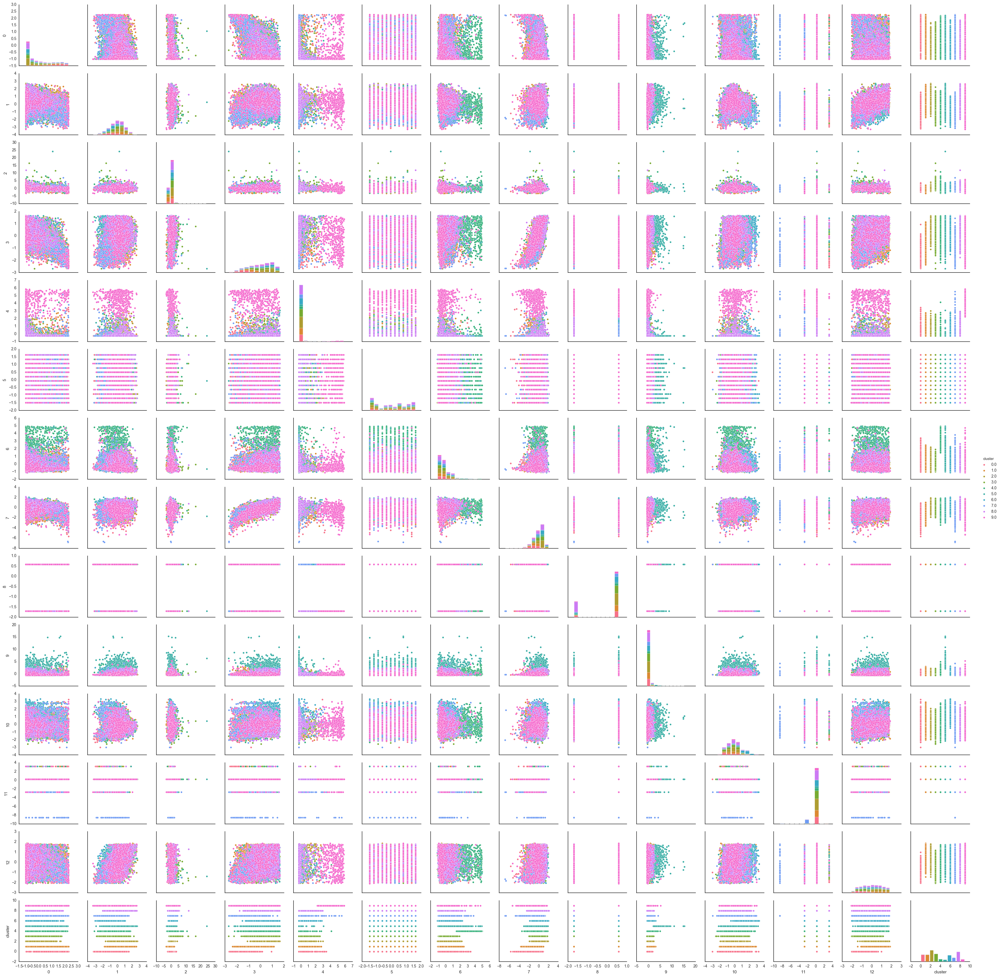

In [71]:
sns.pairplot(Xk, hue='cluster')

## PCA

In [79]:
from sklearn.decomposition import PCA

pca = PCA(n_components=13)
X_pca = pca.fit_transform(X)

In [80]:
pca.explained_variance_ratio_

array([ 0.22126041,  0.11186483,  0.09312949,  0.08624854,  0.08049629,
        0.0804072 ,  0.07050872,  0.06758944,  0.06205033,  0.05512827,
        0.03111635,  0.02982243,  0.0103777 ])

In [81]:
cumulvarExpl = pca.explained_variance_ratio_.cumsum()
cumulvarExpl

array([ 0.22126041,  0.33312524,  0.42625473,  0.51250328,  0.59299956,
        0.67340676,  0.74391548,  0.81150492,  0.87355525,  0.92868352,
        0.95979987,  0.9896223 ,  1.        ])

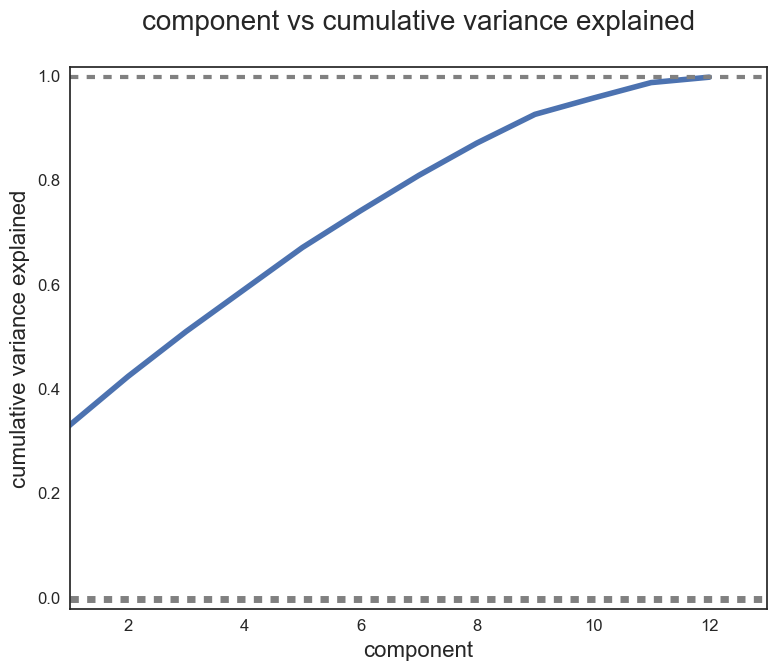

In [82]:
plt.figure(figsize=(9,7))

component_number = range(13)

plt.plot(component_number, cumulvarExpl, lw=4)

plt.axhline(y=0, linewidth=5, color='grey', ls='dashed')
plt.axhline(y=1, linewidth=3, color='grey', ls='dashed')


ax = plt.gca()
ax.set_xlim([1,13])
ax.set_ylim([-.02,1.02])

ax.set_ylabel('cumulative variance explained', fontsize=16)
ax.set_xlabel('component', fontsize=16)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
ax.set_title('component vs cumulative variance explained\n', fontsize=20)

plt.show()

In [83]:
Xt = pd.DataFrame(X_pca, columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13'])
Xt.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,4.323482,-0.393304,-0.382529,0.962440,-1.730161,-0.740015,-0.774641,1.063761,1.025573,-1.066844,0.209260,-0.323472,0.505686
1,-2.226704,-1.330948,-0.826079,-1.339419,0.216700,-0.074822,0.291050,0.548285,0.303641,-0.109319,-0.046555,0.001522,0.454828
2,-0.905158,-1.085817,-2.221125,-0.277115,-0.805630,1.067622,0.488621,-0.399268,-0.488278,0.726782,0.096506,-0.874922,0.212575
3,-0.064000,-0.628142,0.085129,1.061068,2.118533,-0.565502,1.560101,-0.608997,1.122175,-2.082638,0.182729,-0.575178,-0.985817
4,-1.240623,3.125038,-1.203791,1.003302,-1.092431,0.593737,-0.621257,-1.376338,-0.345592,-1.123590,0.192563,-0.417359,0.190810


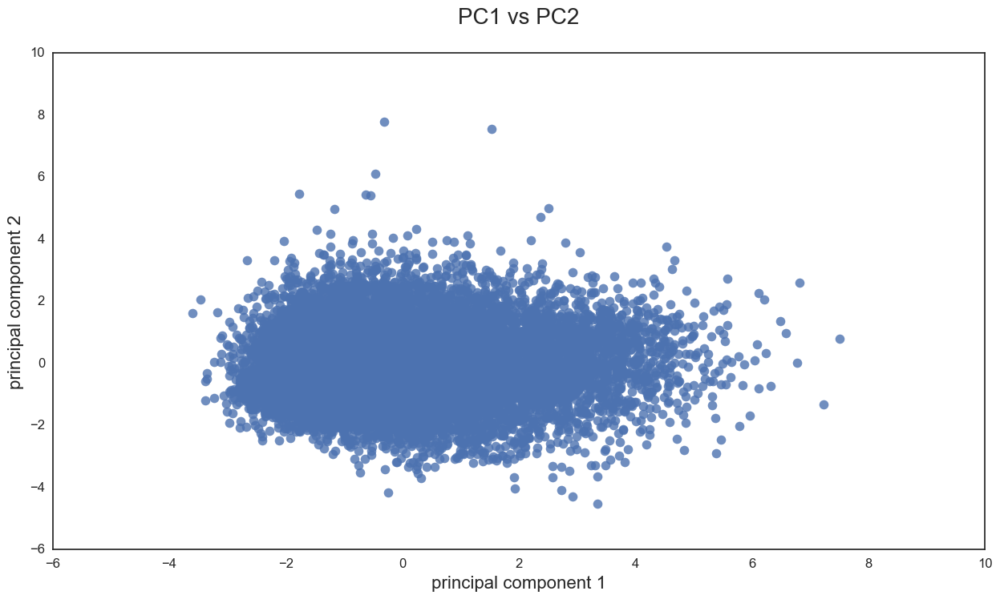

In [84]:
fig = plt.figure(figsize=(15,8))

ax = fig.gca()
ax = sns.regplot(Xt.iloc[:,0], Xt.iloc[:,1],
                 fit_reg=False, scatter_kws={'s':70}, ax=ax)

ax.set_xlabel('principal component 1', fontsize=16)
ax.set_ylabel('principal component 2', fontsize=16)


for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
ax.set_title('PC1 vs PC2\n', fontsize=20)

plt.show()

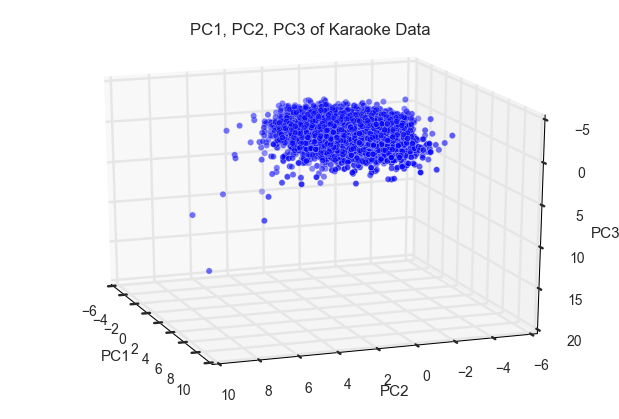

In [85]:
from mpl_toolkits.mplot3d import Axes3D

plt.close('all')
fig1 = plt.figure()
ax = Axes3D(fig1)
ax.scatter(xs = Xt['PC1'], ys = Xt['PC2'], zs = Xt['PC3'])

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('PC1, PC2, PC3 of Karaoke Data')

ax.azim = 200
ax.elev = 199

plt.show()

## K-MEANS FROM PCA

In [166]:
k = 9
kmeans = cluster.KMeans(n_clusters=k)
kmeans.fit(Xt)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [167]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
inertia = kmeans.inertia_

In [168]:
centroids

array([[ -6.66053884e-01,   1.28802188e+00,  -4.80404924e-01,
         -3.40081013e-01,  -4.29283565e-01,   4.18658355e-01,
          1.09061763e-01,  -6.01724567e-01,   1.48488523e-02,
          6.80577721e-02,  -2.85459159e-03,  -8.27643441e-02,
          1.19985880e-02,   5.00000000e+00],
       [  6.37004742e-01,  -1.41156814e+00,  -7.64818743e-01,
          2.23660882e-02,  -5.31875990e-02,  -9.22706313e-02,
         -1.47612905e-02,  -2.60241151e-01,   2.69808321e-03,
          3.81357843e-01,   7.81896529e-02,  -2.34113488e-02,
         -1.35037639e-02,   1.00000000e+00],
       [ -1.47896892e+00,  -2.88233149e-01,   5.61545412e-02,
          2.87315835e+00,   9.87613570e-01,   4.64641993e-02,
          1.53198310e+00,  -1.06721162e+00,   9.83971546e-01,
         -1.57280169e+00,   9.18553877e-02,  -5.44956900e-02,
         -1.31734600e-01,   4.00000000e+00],
       [ -1.17879469e+00,  -2.51088707e-01,   1.08594341e+00,
          3.53147849e-01,  -4.57973995e-01,  -3.33064989e-0

In [169]:
inertia

85775.765037724967

In [170]:
# silhouette score change based on k (plot)

metrics.silhouette_score(Xt, labels, metric='euclidean')

0.26042606555800746

Automatically created module for IPython interactive environment
('For n_clusters =', 2, 'The average silhouette_score is :', 0.26732971275983736)


TypeError: unhashable type

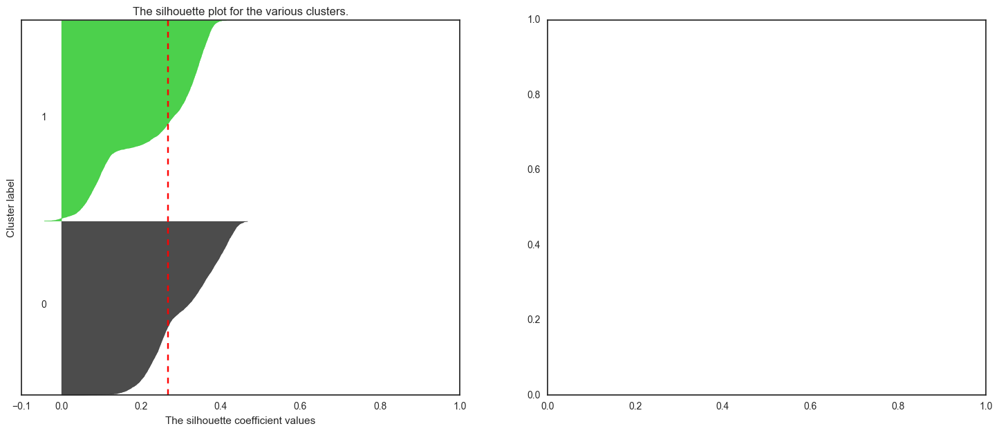

In [180]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.cm as cm


print(__doc__)

# Generating the sample data from make_blobs

range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(Xt) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(Xt)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Xt, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Xt, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(Xt[:, 0], Xt[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [171]:
Xt['cluster']= pd.Series(labels)

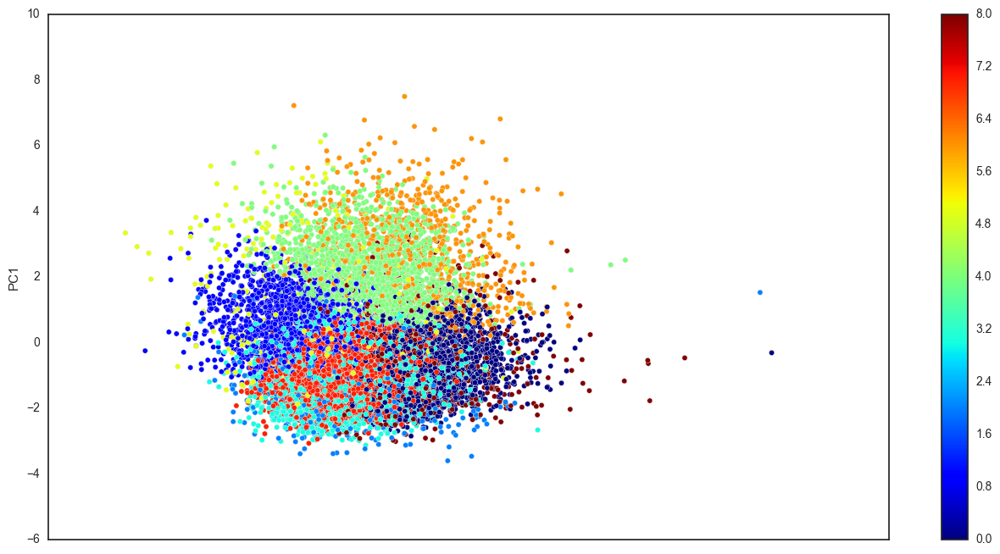

In [172]:
Xt.plot(kind='scatter', x='PC2',y='PC1', c=Xt.cluster.astype(np.float),figsize=(16,8), cmap = 'jet')

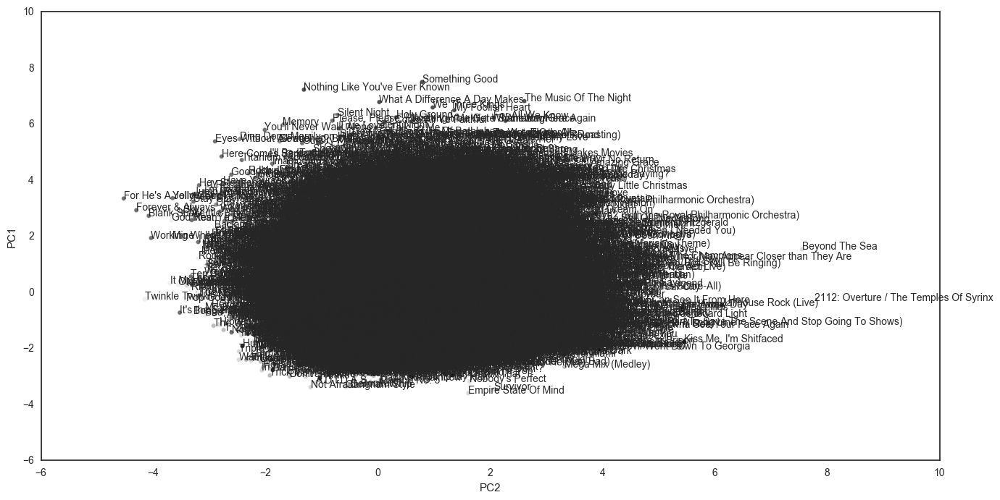

In [173]:
km_s = Xt.plot(kind='scatter', x='PC2',y='PC1', c=Xt.cluster.astype(np.float),figsize=(20,12))
for i, a in enumerate(af['Title']):
    km_s.annotate(a, (Xt.iloc[i].PC2, Xt.iloc[i].PC1))

# t-SNE

In [174]:
from scipy.cluster import hierarchy
from matplotlib import offsetbox
from sklearn import (manifold, decomposition, ensemble, discriminant_analysis, random_projection)

X_iso = manifold.Isomap(n_components=2).fit_transform(X)


In [198]:
def plot_embedding_color(X, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)

    fig = plt.figure(figsize=(15,8))
    ax = plt.subplot(111)
    for i in range(X.shape[0]):
        plt.text(X[i, 0], X[i, 1], str(y[i]),
                 color=plt.cm.Set1(y[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})
    if title is not None:
        plt.title(title)

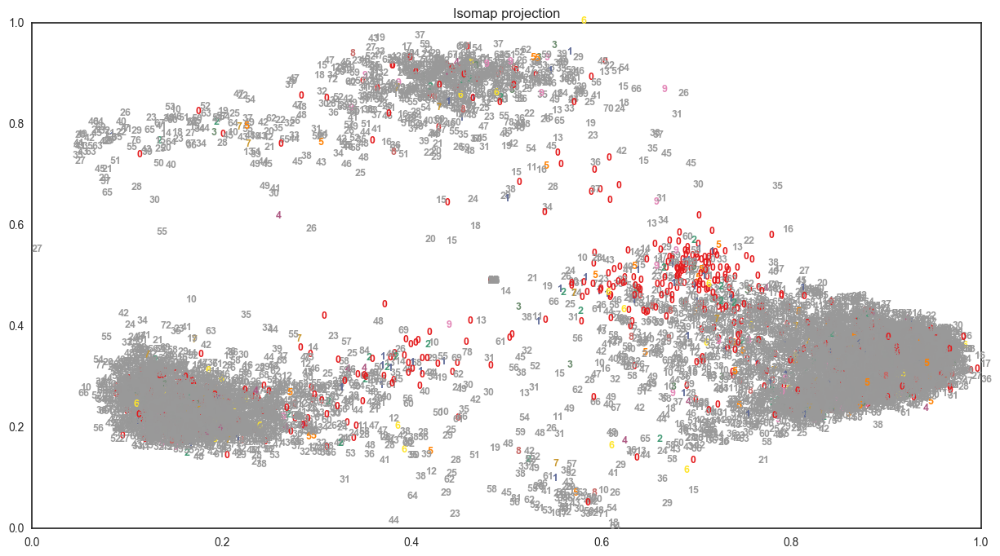

In [199]:
plot_embedding_color(X_iso,"Isomap projection")

## DBSCAN

In [188]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [189]:
db = DBSCAN(eps=0.3, min_samples=100)

In [190]:
db.fit(X)

DBSCAN(algorithm='auto', eps=0.3, leaf_size=30, metric='euclidean',
    min_samples=100, n_jobs=1, p=None)

In [191]:
core_samples = db.core_sample_indices_
dblabels = db.labels_

In [192]:
dblabels

array([-1, -1, -1, ..., -1, -1, -1])

In [193]:
# Can't get silhouette score (All -1 (noise))
silhouette_score(Xt, dblabels)

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

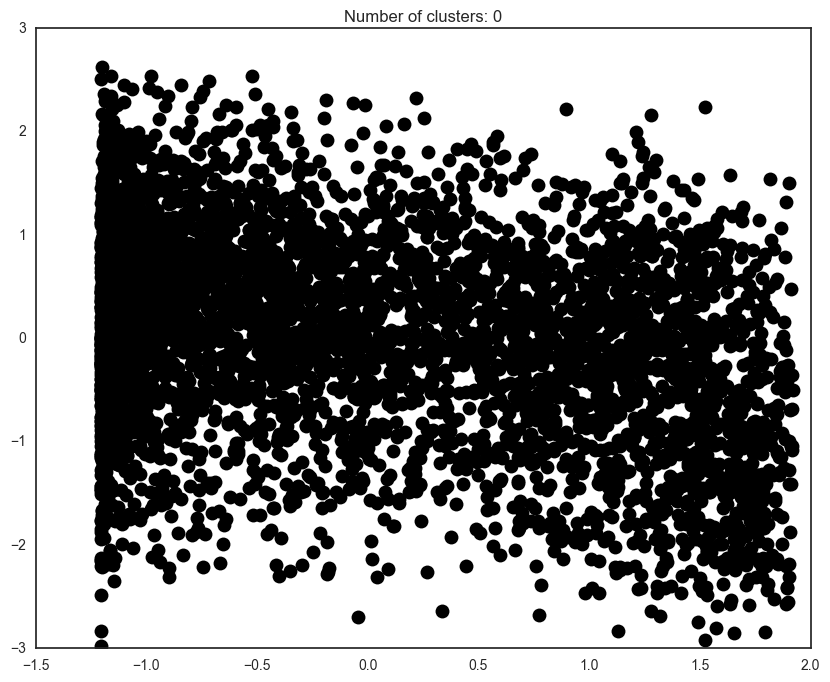

In [134]:
def plot_dbscan(db, Xt):
    fig = plt.figure(figsize=(10,8))
    
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = 'k'

        class_member_mask = (labels == k)

        xy = X[class_member_mask & core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='k', markersize=10)

        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='k', markersize=10)
        

    plt.title('Number of clusters: %d' % n_clusters_);
    
plot_dbscan(db, Xt)

## HIERARCHICAL

In [135]:
from scipy.cluster import hierarchy
from scipy.spatial import distance as ssd
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial import distance as ssd
from scipy.spatial.distance import pdist

In [136]:
Z = linkage(pdist(Xt), 'ward')

In [137]:
c, coph_dists = cophenet(Z, pdist(Xt))
c

0.59923404508499789

([], <a list of 0 Text xticklabel objects>)

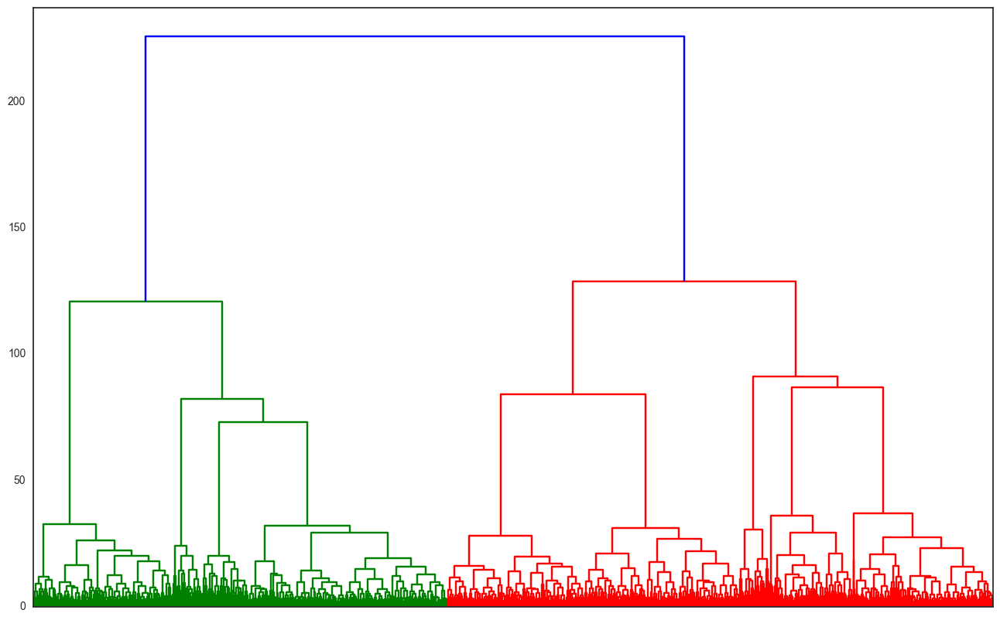

In [138]:
fig, ax = plt.subplots(figsize=(16,10))
dn = hierarchy.dendrogram(Z)
plt.xticks([])